## POST-FL (Hyperparameter $p$ Tuning)

In [1]:
import os
import git
import math
import shutil
import numpy as np
import pandas as pd
from tqdm import tqdm
import matplotlib.pyplot as plt

In [2]:
df = pd.DataFrame([['$\Psi_1$', 170, 320],
                   ['$\Psi_2$', 170, 210]],
                  columns=['Trials', '$f$ in $T^{[c]}_{filtered}$', '$p$ in $T^{[c]}$'])

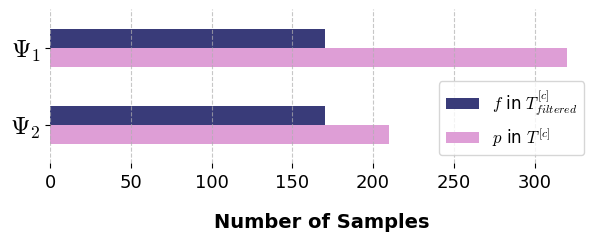

In [4]:
df.plot(x='Trials',
        kind='barh',
        mark_right=True,
        cmap="tab20b",
        figsize=(7, 2),
        fontsize=18
       )

plt.ylabel('')
plt.gca().invert_yaxis()
plt.xlabel('Number of Samples', fontsize=14, labelpad=15, weight='bold')
plt.grid(axis='x', linestyle='--', alpha=0.7)  # Add a grid for the y-axis

plt.rcParams['mathtext.fontset'] = 'cm'

# Remove the frame around the plot
for spine in plt.gca().spines.values():
    spine.set_visible(False)

plt.legend(loc='lower right', fontsize=12)

# Adjust the font size of the x-axis ticks
plt.tick_params(axis='x', labelsize=13)

plt.savefig('./outputs/FAGT_p-tuning.pdf', bbox_inches='tight')
plt.show()


## ISIC-2016 Dataset

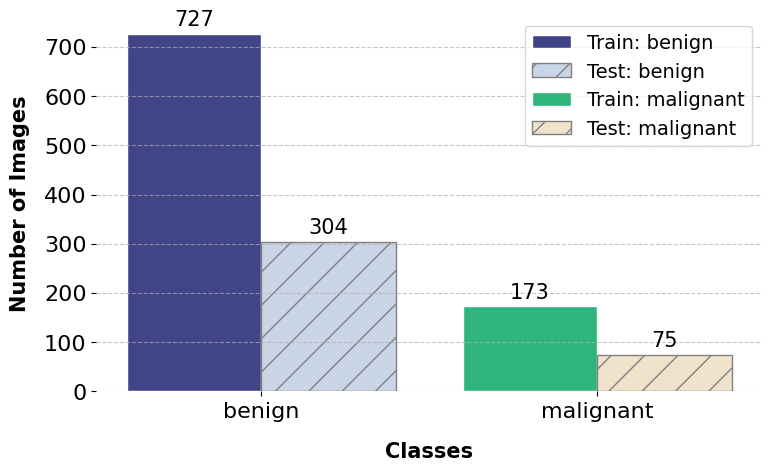

In [6]:
import os
import matplotlib.pyplot as plt
import numpy as np

def autolabel(rects, ax):
    """Attach a text label above each bar, displaying its height."""
    for rect in rects:
        height = rect.get_height()
        ax.annotate(f'{height}',
                    xy=(rect.get_x() + rect.get_width() / 2, height),
                    xytext=(0, 3),  # 3 points vertical offset
                    textcoords="offset points",
                    ha='center', va='bottom', fontsize=15)

training_folder = os.path.abspath('../datasets/ISIC-2016/split/train')
testing_folder = os.path.abspath('../datasets/ISIC-2016/split/test')

categories = os.listdir(training_folder)
training_counts = []
testing_counts = []

for category in categories:
    training_path = os.path.join(training_folder, category)
    testing_path = os.path.join(testing_folder, category)

    if os.path.isdir(training_path):
        training_image_count = len(os.listdir(training_path))
        training_counts.append(training_image_count)

    if os.path.isdir(testing_path):
        testing_image_count = len(os.listdir(testing_path))
        testing_counts.append(testing_image_count)

# Create a figure with a custom size
fig, ax = plt.subplots(figsize=(8, 5))

# Set the width of the bars and their positions
bar_width = 0.4
x_positions = np.arange(len(categories))

# Generate a sequence of evenly spaced values for the color gradient
color_range_1 = np.linspace(0.2, 0.65, len(categories))
color_range_2 = np.linspace(0.35, 0.8, len(categories))

# Choose the colormaps and apply the color values to generate the gradients
training_colors = plt.cm.viridis(color_range_1)
testing_colors = plt.cm.Pastel2(color_range_2)

# Create the bar plots
ax = plt.gca()

for i, category in enumerate(categories):
    training_bar = ax.bar(x_positions[i] - bar_width / 2, training_counts[i], color=training_colors[i], width=bar_width, label=f"Train: {category}", edgecolor='white')
    testing_bar = ax.bar(x_positions[i] + bar_width / 2, testing_counts[i], color=testing_colors[i], width=bar_width, label=f"Test: {category}", hatch='/', edgecolor='gray')

    # Add labels on top of the bars
    autolabel(training_bar, ax)
    autolabel(testing_bar, ax)

# Set the global font size
plt.rcParams.update({'font.size': 16})    
    
# Customize plot appearance
plt.xlabel("Classes", fontsize=15, labelpad=15, weight='bold')
plt.ylabel("Number of Images", fontsize=15, labelpad=10, weight='bold')
plt.xticks(x_positions, categories, rotation=0)  # Rotate category labels for better readability
plt.grid(axis='y', linestyle='--', alpha=0.7)  # Add a grid for the y-axis

# Create a custom legend to avoid duplicate labels
handles, labels = plt.gca().get_legend_handles_labels()
by_label = dict(zip(labels, handles))
plt.legend(by_label.values(), by_label.keys(), fontsize=14)

# Remove the frame around the plot
for spine in plt.gca().spines.values():
    spine.set_visible(False)

# Show the plot
plt.tight_layout()
plt.show()

fig.savefig('./outputs/ISIC-2016_dataset.pdf', bbox_inches='tight')

## HAM10000 Dataset

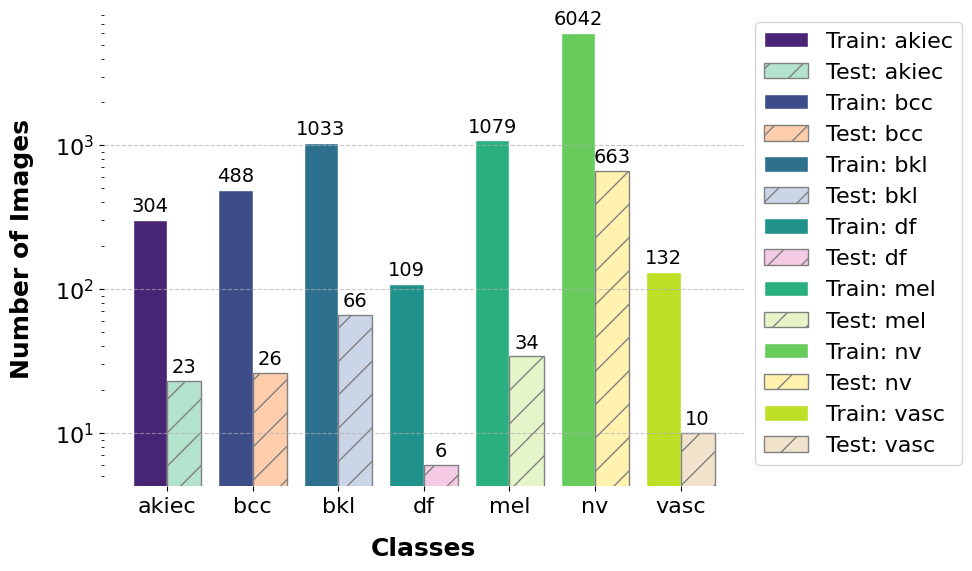

In [8]:
import os
import matplotlib.pyplot as plt
import numpy as np

def autolabel(rects, ax):
    """Attach a text label above each bar, displaying its height."""
    for rect in rects:
        height = rect.get_height()
        ax.annotate(f'{height}',
                    xy=(rect.get_x() + rect.get_width() / 2, height),
                    xytext=(0, 3),  # 3 points vertical offset
                    textcoords="offset points",
                    ha='center', va='bottom', fontsize=14)

training_folder = os.path.abspath('../datasets/HAM10000/split/train')
testing_folder = os.path.abspath('../datasets/HAM10000/split/test')

categories = os.listdir(training_folder)
training_counts = []
testing_counts = []

for category in categories:
    training_path = os.path.join(training_folder, category)
    testing_path = os.path.join(testing_folder, category)

    if os.path.isdir(training_path):
        training_image_count = len(os.listdir(training_path))
        training_counts.append(training_image_count)

    if os.path.isdir(testing_path):
        testing_image_count = len(os.listdir(testing_path))
        testing_counts.append(testing_image_count)

# Create a figure with a custom size
fig, ax = plt.subplots(figsize=(10, 6))

# Set the width of the bars and their positions
bar_width = 0.4
x_positions = np.arange(len(categories))

# Generate a sequence of evenly spaced values for the color gradient
color_range_1 = np.linspace(0.1, 0.9, len(categories))
color_range_2 = np.linspace(0.1, 0.8,len(categories))

# Choose the colormaps and apply the color values to generate the gradients
training_colors = plt.cm.viridis(color_range_1)
testing_colors = plt.cm.Pastel2(color_range_2)

# Create the bar plots
ax = plt.gca()

for i, category in enumerate(categories):
    training_bar = ax.bar(x_positions[i] - bar_width / 2, training_counts[i], color=training_colors[i], width=bar_width, label=f"Train: {category}", edgecolor='white')
    testing_bar = ax.bar(x_positions[i] + bar_width / 2, testing_counts[i], color=testing_colors[i], width=bar_width, label=f"Test: {category}", hatch='/', edgecolor='gray')

    # Add labels on top of the bars
    autolabel(training_bar, ax)
    autolabel(testing_bar, ax)

# Set the global font size
plt.rcParams.update({'font.size': 16})    
    
# Customize plot appearance
plt.xlabel("Classes", fontsize=18, labelpad=15, weight='bold')
plt.ylabel("Number of Images", fontsize=18, labelpad=15, weight='bold')
plt.yscale("log")
# plt.title("")
plt.xticks(x_positions, categories, rotation=0)  # Rotate category labels for better readability
plt.grid(axis='y', linestyle='--', alpha=0.7)  # Add a grid for the y-axis

# Create a custom legend to avoid duplicate labels
handles, labels = plt.gca().get_legend_handles_labels()
by_label = dict(zip(labels, handles))
plt.legend(by_label.values(), by_label.keys(), loc="upper left", bbox_to_anchor=(1, 1))

# Remove the frame around the plot
for spine in plt.gca().spines.values():
    spine.set_visible(False)
    
# Show the plot
plt.tight_layout()
plt.show()

fig.savefig('./outputs/HAM10000_dataset.pdf', bbox_inches='tight')

## ISIC-2016 Original+Transformation+StyleGAN2-ADA

In [9]:
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

original_dir = os.path.abspath('../datasets/ISIC-2016/split/train')
oversample_dir = os.path.abspath('../datasets/ISIC-2016/image-data-generator')

targetnames = ['benign', 'malignant']

for x in targetnames:    
    original = globals()['%s_original' % x] = len(os.listdir(original_dir + '/' + x))
    oversample = globals()['%s_oversample' % x] = len(os.listdir(oversample_dir + '/' + x))
    globals()['%s_generated' % x] = oversample - original
        
for x in targetnames:
    globals()['%s_GAN' % x] = 2000 - globals()['%s_oversample' % x]

# Define the DataFrame
df = pd.DataFrame([['benign', benign_original, benign_generated, benign_GAN],
                   ['malignant', malignant_original, malignant_generated, malignant_GAN]],
                  columns=['Class', 'Original', 'Transformation', 'StyleGAN2-ADA'])

In [10]:
df

,Class,Original,Transformation,StyleGAN2-ADA
0,benign,727,192,1081
1,malignant,173,679,1148


In [11]:
matrix = df[['Original', 'Transformation', 'StyleGAN2-ADA']].values.tolist()
classes = df['Class'].values.tolist()

In [12]:
matrix

[[727, 192, 1081], [173, 679, 1148]]

In [13]:
classes

['benign', 'malignant']

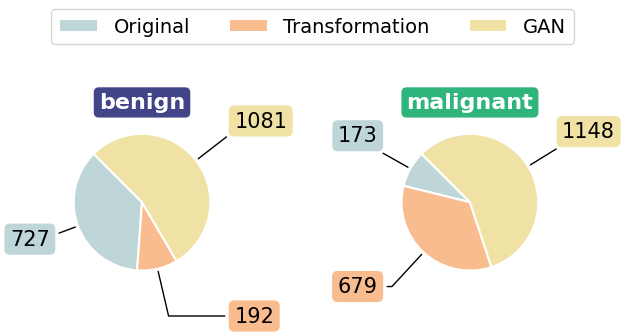

In [15]:
# import matplotlib.pyplot as plt
# import numpy as np

# Create a list of 7 sets of 3 pie chart data
pie_data = matrix

# Create a list of colors for the pie charts
colors = ['#BFD6D9', '#F9BC8F', '#F0E2A4']

# Create a list of labels for the pie charts
labels = classes

# Create 7 subplots with 2 rows
fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(7, 4))

# Flatten the array of axes for easier indexing
ax = ax.flatten()

# Choose the colormaps and apply the color values to generate the gradients
color_codes = plt.cm.viridis(np.linspace(0.2, 0.65, 2))

# Loop through each subplot and create a 3 pie chart
for i in range(2):
    wedges, _, _ = ax[i].pie(pie_data[i], colors=colors, startangle=135, autopct='', pctdistance=0.1, labeldistance=1.05, wedgeprops={'edgecolor': 'w', 'linewidth': 1.5})
    ax[i].set_title(f'{labels[i].lower()}', color='white', fontweight='bold', fontsize=16, bbox={'facecolor': color_codes[i], 'edgecolor': color_codes[i], 'pad': 0.2, 'boxstyle': 'round'})
    
    # Add a white circle to create a donut plot
    # centre_circle = plt.Circle((0,0), 0.50, fc='white')
    # ax[i].add_artist(centre_circle)
    
    # Add values to the pie charts and lines connecting them
    recipe = [f"{pie_data[i][j]}" for j in range(3)]
    
    for j, w in enumerate(wedges):
        ang = (w.theta2 - w.theta1)/2. + w.theta1
        x, y = w.center
        x = x + 1 * np.cos(np.deg2rad(ang))
        y = y + 1 * np.sin(np.deg2rad(ang))
        
        kw = dict(arrowprops=dict(arrowstyle="-"), 
                  bbox=dict(boxstyle="round, pad=0.3", edgecolor="white", facecolor=colors[j]))
        
        if recipe[j] != '0':
            horizontalalignment = {-1: "right", 1: "left"}[int(np.sign(x))]
            connectionstyle = f"angle,angleA=0,angleB={ang}"
            kw["arrowprops"].update({"connectionstyle": connectionstyle})
            ax[i].annotate(recipe[j], xy=(x, y), xytext=(1.35*np.sign(x), 1.8*y),
                        horizontalalignment=horizontalalignment, **kw, fontsize=15)
    
# Adjust the spacing between subplots
fig.tight_layout(pad=2.0)

# Hide the last subplot for the 8th label
# ax[-1].set_visible(False)

# Create a single legend for all the pie charts

# bottom
# fig.legend(['Original', 'Transformation', 'GAN'], 
#            fontsize=14, 
#            loc='lower center', 
#            ncol=3, 
#            bbox_to_anchor=(0.5, -0.05))

# top
fig.legend(['Original', 'Transformation', 'GAN'], 
           fontsize=14, 
           loc='lower center', 
           ncol=3, 
           bbox_to_anchor=(0.5, 0.9))

# Display the plot
plt.show()

# save figure
fig.savefig('./outputs/ISIC-2016_augmented.pdf', bbox_inches='tight')

## HAM10000 Original+Transformation+StyleGAN2-ADA

In [16]:
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

original_dir = os.path.abspath('../datasets/HAM10000/split/train')
oversample_dir = os.path.abspath('../datasets/HAM10000/image-data-generator')

targetnames = ['akiec', 'bcc', 'bkl', 'df', 'mel', 'nv', 'vasc']

for x in targetnames:    
    original = globals()['%s_original' % x] = len(os.listdir(original_dir + '/' + x))
    if x != 'nv':
        oversample = globals()['%s_oversample' % x] = len(os.listdir(oversample_dir + '/' + x))
        globals()['%s_generated' % x] = oversample - original
        
for x in targetnames:
    if x != 'nv':
        globals()['%s_GAN' % x] = nv_original - globals()['%s_oversample' % x]
        
df = pd.DataFrame([['akiec', akiec_original, akiec_generated, akiec_GAN],
                   ['bcc', bcc_original, bcc_generated, bcc_GAN],
                   ['bkl', bkl_original, bkl_generated, bkl_GAN],
                   ['df', df_original, df_generated, df_GAN],
                   ['mel', mel_original, mel_generated, mel_GAN],
                   ['nv', nv_original, 0, 0],
                   ['vasc', vasc_original, vasc_generated, vasc_GAN]],
                  columns=['Class', 'Original', 'Transformation', 'StyleGAN2-ADA'])

In [17]:
df

,Class,Original,Transformation,StyleGAN2-ADA
0,akiec,304,1520,4218
1,bcc,488,1528,4026
2,bkl,1033,2578,2431
3,df,109,532,5401
4,mel,1079,2606,2357
5,nv,6042,0,0
6,vasc,132,524,5386


In [18]:
matrix = df[['Original', 'Transformation', 'StyleGAN2-ADA']].values.tolist()
classes = df['Class'].values.tolist()

In [19]:
matrix

[[304, 1520, 4218],
 [488, 1528, 4026],
 [1033, 2578, 2431],
 [109, 532, 5401],
 [1079, 2606, 2357],
 [6042, 0, 0],
 [132, 524, 5386]]

In [20]:
classes

['akiec', 'bcc', 'bkl', 'df', 'mel', 'nv', 'vasc']

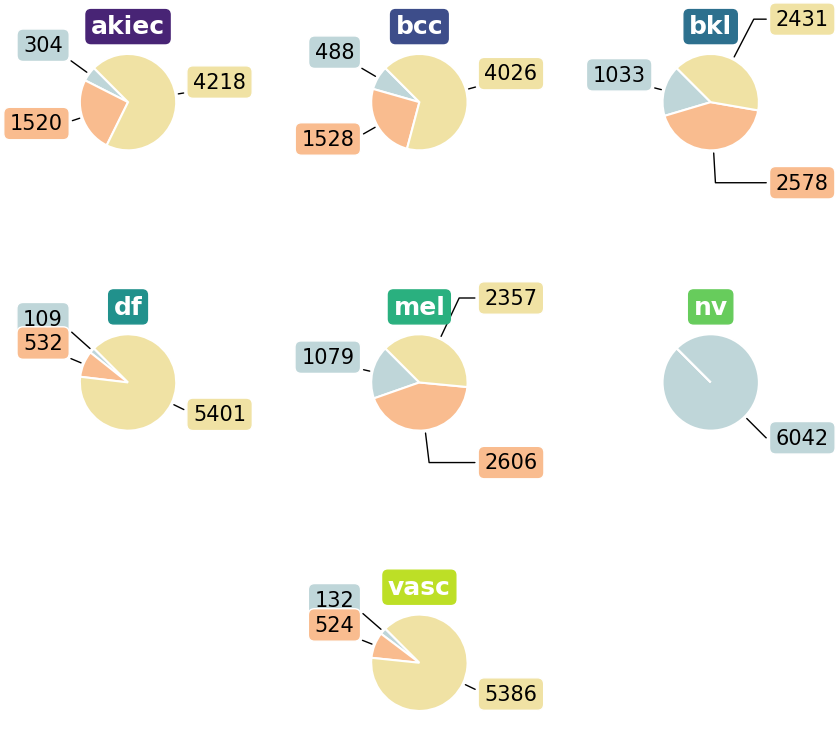

In [22]:
# Create a list of 7 sets of 3 pie chart data
pie_data = matrix

# Create a list of colors for the pie charts
colors = ['#BFD6D9', '#F9BC8F', '#F0E2A4']

# Create a list of labels for the pie charts
labels = classes

# Create 7 subplots with 2 rows
fig, ax = plt.subplots(nrows=3, ncols=3, figsize=(14, 8))

# Flatten the array of axes for easier indexing
ax = ax.flatten()

# Indices of subplots where confusion matrices should be placed
cm_indices = [0, 1, 2, 3, 4, 5, 7]

# Choose the colormaps and apply the color values to generate the gradients
color_codes = plt.cm.viridis(np.linspace(0.1, 0.9, 7))

# Loop through each subplot and create a 3 pie chart
for i, cm_idx in enumerate(cm_indices):
    wedges, _, _ = ax[cm_idx].pie(
        pie_data[i], colors=colors, 
        startangle=135, 
        autopct='', 
        pctdistance=0.1, 
        labeldistance=1.05, 
        wedgeprops={'edgecolor': 'w', 'linewidth': 1.5})
    ax[cm_idx].set_title(
        f'{labels[i].lower()}', 
        color='white', 
        fontweight='bold', 
        fontsize=18, 
        bbox={'facecolor': color_codes[i], 'edgecolor': color_codes[i], 'pad': 0.2, 'boxstyle': 'round'})
    
    # Add values to the pie charts and lines connecting them
    recipe = [f"{pie_data[i][j]}" for j in range(3)]
    
    for j, w in enumerate(wedges):
        ang = (w.theta2 - w.theta1)/2. + w.theta1
        x, y = w.center
        x = x + 1 * np.cos(np.deg2rad(ang))
        y = y + 1 * np.sin(np.deg2rad(ang))
        
        kw = dict(arrowprops=dict(arrowstyle="-"), 
                  bbox=dict(boxstyle="round, pad=0.3", edgecolor="white", facecolor=colors[j]))
        
        if recipe[j] != '0':
            horizontalalignment = {-1: "right", 1: "left"}[int(np.sign(x))]
            connectionstyle = f"angle,angleA=0,angleB={ang}"
            kw["arrowprops"].update({"connectionstyle": connectionstyle})
            ax[cm_idx].annotate(recipe[j], xy=(x, y), xytext=(1.35*np.sign(x), 1.8*y),
                        horizontalalignment=horizontalalignment, **kw, fontsize=15)
    
# Adjust the spacing between subplots
fig.tight_layout(w_pad=-20, h_pad=4)

# Hide the last subplot for the 8th label
ax[-1].set_visible(False)
ax[-3].set_visible(False)

# Display the plot
plt.show()

# save figure
fig.savefig('./outputs/HAM10000_augmented.pdf', bbox_inches='tight')

# ============= ISIC-2016 =============

## UMAP 2D

In [23]:
from numba.core.errors import NumbaDeprecationWarning, NumbaPendingDeprecationWarning
import warnings

warnings.simplefilter('ignore', category=NumbaDeprecationWarning)
warnings.simplefilter('ignore', category=NumbaPendingDeprecationWarning)

In [24]:
import os
import numpy as np
from PIL import Image
from sklearn.preprocessing import StandardScaler, LabelEncoder
import umap
import matplotlib.pyplot as plt

def load_images_from_folder(folder_path):
    images = []
    labels = []
    for class_name in os.listdir(folder_path):
        class_folder = os.path.join(folder_path, class_name)
        if os.path.isdir(class_folder):
            for filename in os.listdir(class_folder):
                img_path = os.path.join(class_folder, filename)
                try:
                    img = Image.open(img_path).convert('RGB').resize((64, 64))
                    images.append(np.array(img).flatten())
                    labels.append(class_name)
                except Exception as e:
                    print(f"Error loading image {img_path}: {e}")
    return images, labels

def display_umap(images, labels, width=5, height=4, title='NA', save_name='NA', cmap='coolwarm', legend=False):
    images = StandardScaler().fit_transform(images)
    reducer = umap.UMAP(random_state=42)
    embedding = reducer.fit_transform(images)
    
    label_encoder = LabelEncoder()
    numeric_labels = label_encoder.fit_transform(labels)
    unique_labels = sorted(set(labels))
    num_classes = len(unique_labels)

    fig, ax = plt.subplots(figsize=(width, height))
    sc = ax.scatter(embedding[:, 0], embedding[:, 1], c=numeric_labels, cmap=cmap, s=4)
    ax.set_aspect('equal', 'datalim')
    ax.set_title(f'{title}', fontsize=13, weight='bold')
    ax.set_xticklabels([])
    ax.set_yticklabels([])
    
    if (legend==True):
        cbar = fig.colorbar(sc, boundaries=np.arange(num_classes + 1) - 0.5, ax=ax)
        cbar.set_ticks(np.arange(num_classes))
        cbar.set_ticklabels(unique_labels, rotation=90)

    plt.show()
    fig.savefig(f'./outputs/UMAP/{save_name}.png', dpi=600, bbox_inches='tight')

### ISIC-2016 (Original)

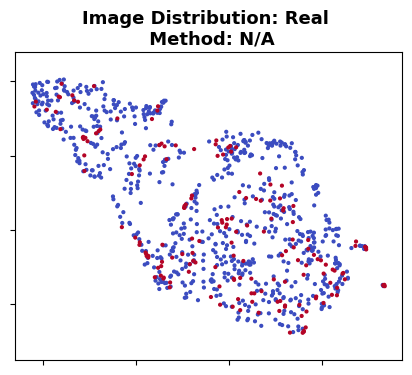

In [25]:
# folder path
folder_path = os.path.abspath('../datasets/ISIC-2016/split/train')

# images and labels
images, labels = load_images_from_folder(folder_path)

# display UMAP
if images and labels:
    display_umap(images, labels, title='Image Distribution: Real \n Method: N/A', save_name='ISIC-2016/ISIC-2016-OG')
else:
    print("No images were found in the specified folder.")

### ISIC-2016 (No-Filtering)

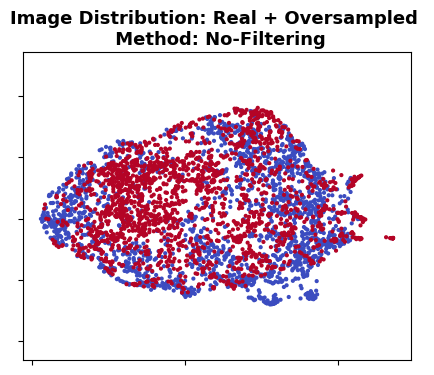

In [26]:
# folder path
folder_path = os.path.abspath('../datasets/ISIC-2016/dataset-processed/dataset-models/isic-2016-model-train-no-filtering')

# images and labels
images, labels = load_images_from_folder(folder_path)

# display UMAP
if images and labels:
    display_umap(images, labels, title='Image Distribution: Real + Oversampled \n Method: No-Filtering', save_name='ISIC-2016/ISIC-2016-NO-FL')
else:
    print("No images were found in the specified folder.")

### ISIC-2016 (PRE-FL+α1=0.80)

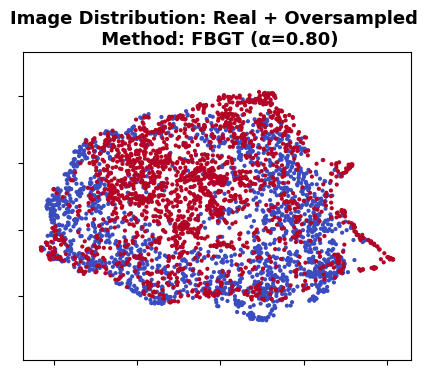

In [27]:
# folder path
folder_path = os.path.abspath('../datasets/ISIC-2016/dataset-processed/dataset-models/isic-2016-model-train-fbgt-alpha-1')

# images and labels
images, labels = load_images_from_folder(folder_path)

# display UMAP
if images and labels:
    display_umap(images, labels, title='Image Distribution: Real + Oversampled \n Method: FBGT (α=0.80)', save_name='ISIC-2016/ISIC-2016-FBGT-alpha-1')
else:
    print("No images were found in the specified folder.")

### ISIC-2016 (POST-FL+α1=0.75)

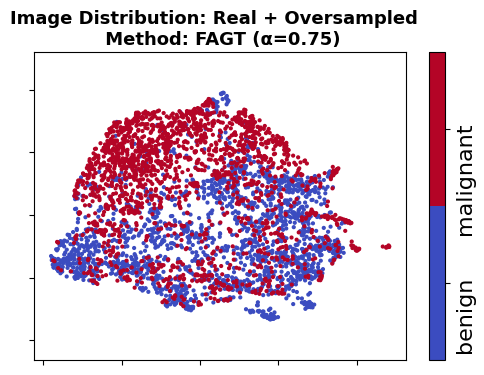

In [28]:
# folder path
folder_path = os.path.abspath('../datasets/ISIC-2016/dataset-processed/dataset-models/isic-2016-model-train-fagt-alpha-1')

# images and labels
images, labels = load_images_from_folder(folder_path)

# display UMAP
if images and labels:
    display_umap(images, labels, width=6, title='Image Distribution: Real + Oversampled  \n Method: FAGT (α=0.75)', save_name='ISIC-2016/ISIC-2016-FAGT-alpha-1', legend=True)
else:
    print("No images were found in the specified folder.")

# ============= HAM10000 =============

## UMAP 3D

In [29]:
import os
import numpy as np
import cv2
import umap
import matplotlib.pyplot as plt
import seaborn as sns

def load_images_from_folder(folder):
    data = []
    labels = []
    for subdir, dirs, files in os.walk(folder):
        for file in files:
            if file.lower().endswith(('.png', '.jpg', '.jpeg')):
                img = cv2.imread(os.path.join(subdir, file), cv2.IMREAD_GRAYSCALE)
                img = cv2.resize(img, (64, 64)).flatten()
                data.append(img)
                labels.append(os.path.basename(subdir))
    return np.array(data), labels

def plot_3d_umap(data, labels, angle_1, angle_2, save_name='NA', title='NA', legend=False):
    reduced_data = umap.UMAP(n_components=3, random_state=42).fit_transform(data)
    sns.set(style='white')
    fig = plt.figure(figsize=(30, 30))
    ax = fig.add_subplot(111, projection='3d')
    ax.view_init(angle_1, angle_2)

    unique_labels = np.unique(labels)
    for label in unique_labels:
        selected_data = reduced_data[np.where(np.array(labels) == label)]
        ax.scatter(selected_data[:, 0], selected_data[:, 1], selected_data[:, 2], label=label)

    if legend==True:
        legend = ax.legend(fontsize=55, ncol=4, bbox_to_anchor=(1, 1.1))
        # Make the border and background of the legend invisible
        legend.get_frame().set_linewidth(0)
        legend.legendPatch.set_alpha(0)
        # Increase the size of the dots
        for handle in legend.legend_handles:
            handle.set_sizes([2500])
        
    ax.set_title(f'{title}', fontsize=78, loc='center', y=-0.1, weight='bold')
    ax.set_xticklabels([])
    ax.set_yticklabels([])
    ax.set_zticklabels([])
    plt.show()
    fig.savefig(f'./outputs/UMAP/{save_name}.jpg', dpi=150, bbox_inches='tight')

### HAM10000(Original)

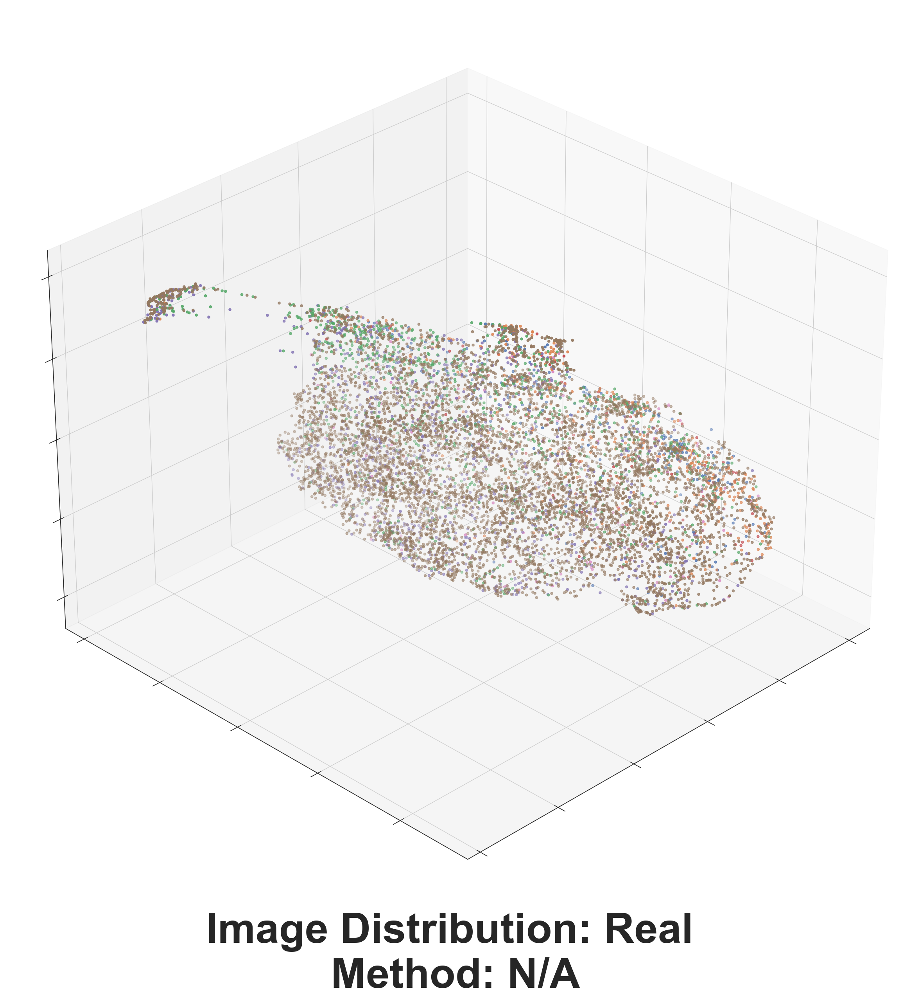

In [30]:
folder_path = os.path.abspath('../datasets/HAM10000/split/train')
data, labels = load_images_from_folder(folder_path)

angle_1 = 30
angle_2 = 45
plot_3d_umap(data, labels, angle_1, angle_2, title='Image Distribution: Real \nMethod: N/A', save_name='HAM10000/HAM10000-OG', legend=False)

### HAM10000(No-Filtering)

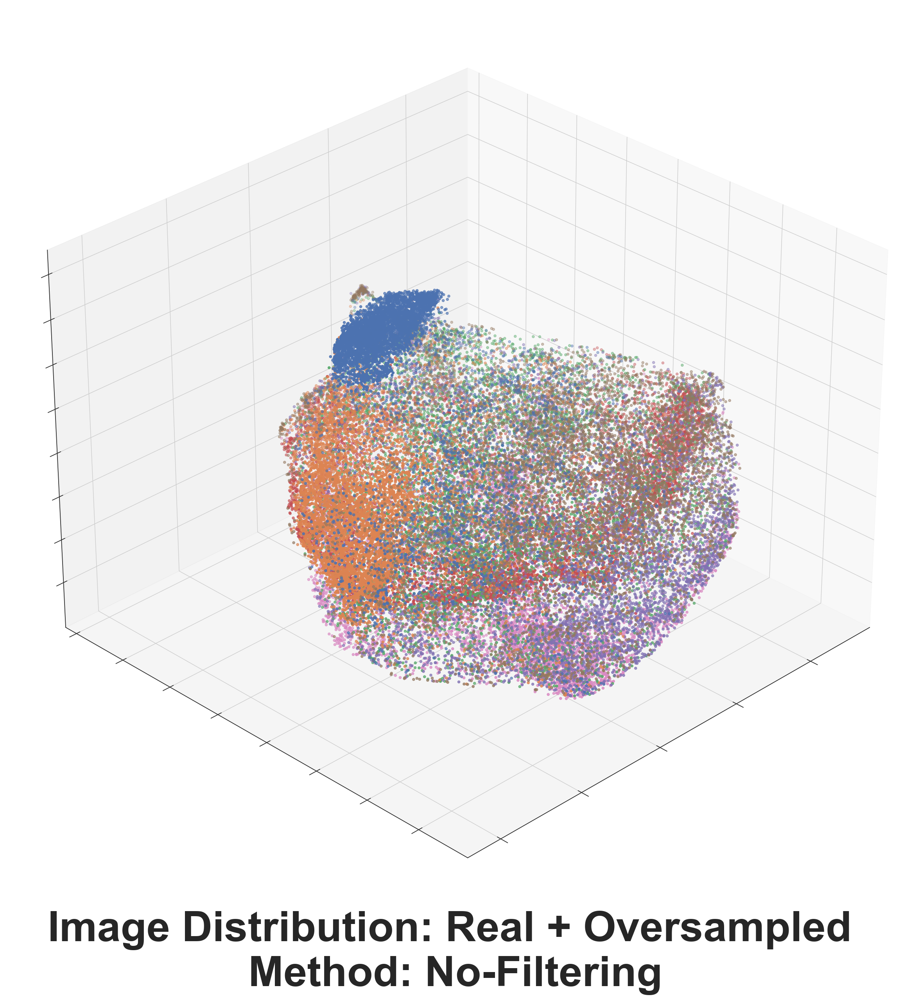

In [31]:
folder_path = os.path.abspath('../datasets/HAM10000/dataset-processed/dataset-models/ham10000-model-train-no-filtering')
data, labels = load_images_from_folder(folder_path)

angle_1 = 30
angle_2 = 45
plot_3d_umap(data, labels, angle_1, angle_2, title='Image Distribution: Real + Oversampled \nMethod: No-Filtering', save_name='HAM10000/HAM10000-NO-FL', legend=False)

### HAM10000(PRE-FL+α1=0.80)

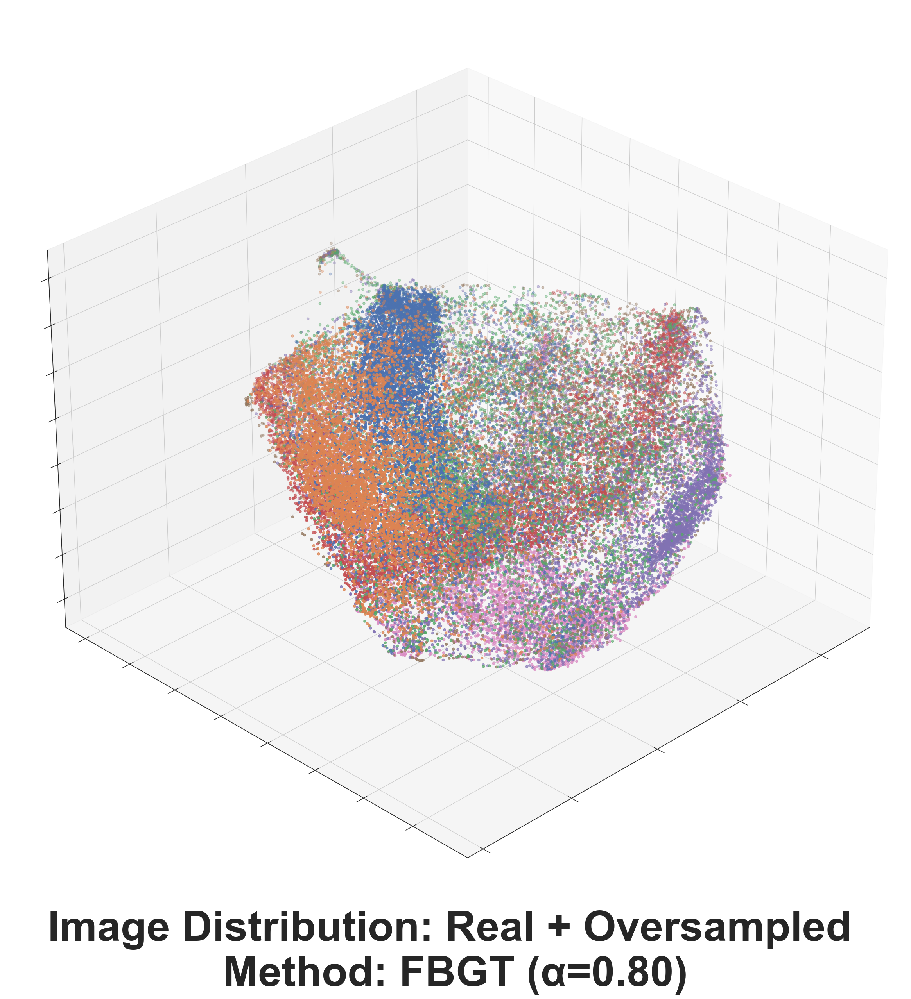

In [32]:
folder_path = os.path.abspath('../datasets/HAM10000/dataset-processed/dataset-models/ham10000-model-train-fbgt-alpha-1')
data, labels = load_images_from_folder(folder_path)

angle_1 = 30
angle_2 = 45
plot_3d_umap(data, labels, angle_1, angle_2, title='Image Distribution: Real + Oversampled \nMethod: FBGT (α=0.80)', save_name='HAM10000/HAM10000-FBGT-alpha-1', legend=False)

### HAM10000(POST-FL+α3=0.85)

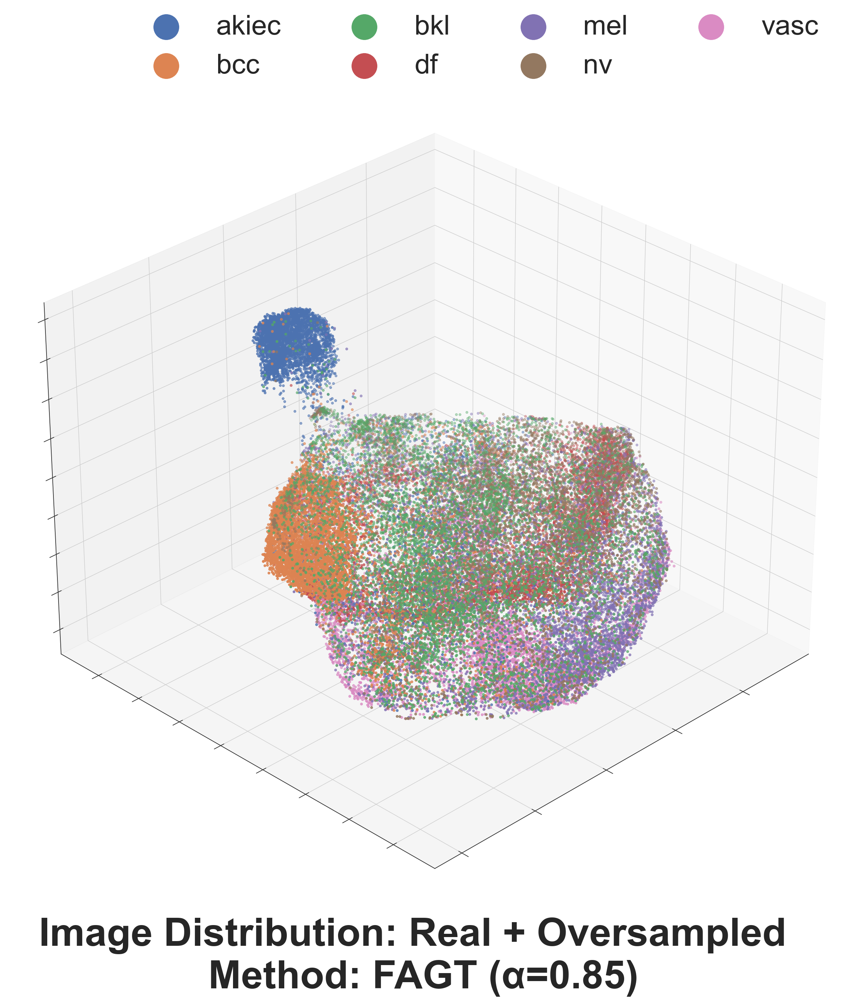

In [33]:
folder_path = os.path.abspath('../datasets/HAM10000/dataset-processed/dataset-models/ham10000-model-train-fagt-alpha-3')
data, labels = load_images_from_folder(folder_path)

angle_1 = 30
angle_2 = 45
plot_3d_umap(data, labels, angle_1, angle_2, title='Image Distribution: Real + Oversampled  \nMethod: FAGT (α=0.85)', save_name='HAM10000/HAM10000-FAGT-alpha-3', legend=True)